In [1]:
using MatrixProductBP, MatrixProductBP.Models
using IndexedGraphs, DelimitedFiles, Plots, Statistics, LaTeXStrings, Random
import ProgressMeter; ProgressMeter.ijulia_behavior(:clear)
import Measurements: value, ±
using Graphs
using JLD2
using Unzip
using MPSExperiments
include("../aux/meanfield.jl");

Precompiling MatrixProductBP
  ✓ MatrixProductBP
  1 dependency successfully precompiled in 20 seconds. 148 already precompiled.
Precompiling MPSExperiments
  ✓ MatrixFactorizations
  ✓ MPSExperiments
  2 dependencies successfully precompiled in 14 seconds. 195 already precompiled.


In [2]:
include("../../telegram/notifications.jl");

In [3]:
T = 10^4     # final time
ρ = 0.1   # prob. of recovery
γ = 0.5    # prob. of being zero patient
k = 3;

In [4]:
λs = 0.03:0.02:0.09;

## Meanfield

In [5]:
N = 10^3
g = IndexedGraph(random_regular_graph(N, k))
p_dmp_disc, p_ibmf_disc, p_cme_disc = map(λs) do λ
    p_dmp_disc, = dmp_disc(T, 1.0, g, λ, ρ, fill(γ, nv(g)))     
    p_ibmf_disc = ibmf_disc(T, 1.0, g, λ, ρ, fill(γ, nv(g)))
    p_cme_disc, = cme_disc(T, 1.0, g, λ, ρ, fill(γ, nv(g)))
    p_dmp_disc, p_ibmf_disc, p_cme_disc
end |> unzip;

Progress: 100%|█████████████████████████████████████████| Time: 0:00:03
Progress: 100%|█████████████████████████████████████████| Time: 0:00:00
Progress: 100%|█████████████████████████████████████████| Time: 0:00:01
Progress: 100%|█████████████████████████████████████████| Time: 0:00:01
Progress: 100%|█████████████████████████████████████████| Time: 0:00:00
Progress: 100%|█████████████████████████████████████████| Time: 0:00:01
Progress: 100%|█████████████████████████████████████████| Time: 0:00:01
Progress: 100%|█████████████████████████████████████████| Time: 0:00:00
Progress: 100%|█████████████████████████████████████████| Time: 0:00:01
Progress: 100%|█████████████████████████████████████████| Time: 0:00:01
Progress: 100%|█████████████████████████████████████████| Time: 0:00:00
Progress: 100%|█████████████████████████████████████████| Time: 0:00:01


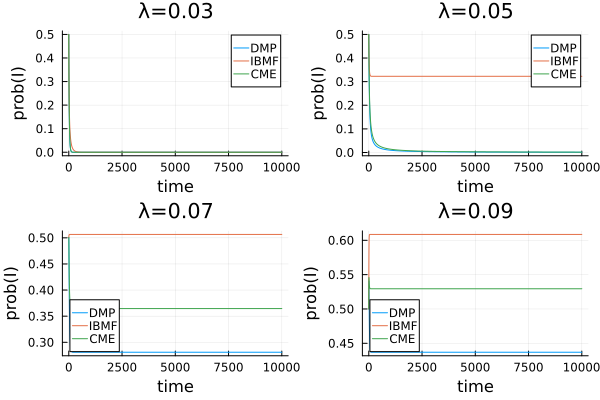

In [6]:
pl_mc1 = map(eachindex(λs)) do a
    pl = plot(; xlabel="time", ylabel="prob(I)", title="λ=$(λs[a])")
    plot!(pl, 0:T, mean(p_dmp_disc[a]), label="DMP")
    plot!(pl, 0:T, mean(p_ibmf_disc[a]), label="IBMF")
    plot!(pl, 0:T, mean(p_cme_disc[a]), label="CME")
    pl
end

plot(pl_mc1...)

## Montecarlo

In [7]:
Ts = [400, 2000, 500, 500];

In [ ]:
p_mc = map(eachindex(λs)) do a
    λ = λs[a]
    sis = SIS(g, λ, ρ, Ts[a]; γ=fill(γ, N))
    bp = mpbp(sis)
    sms = SoftMarginSampler(bp)
    nsamples = 5*10^3
    sample!(sms, nsamples)
    b_mc = marginals(sms)
    p_mc = [[value(bb[INFECTIOUS]/sum(bb)) for bb in b] for b in b_mc]
    println("λ=$λ done. $a of $(length(λs))")
    p_mc
end;

SoftMargin sampling   3%|█                               |  ETA: 0:09:26m

In [ ]:
pl_mc = deepcopy(pl_mc1)
for (pl, p, T) in zip(pl_mc, p_mc, Ts)
    plot!(pl, 0:T, mean(p), st=:scatter, m=:o, label="MonteCarlo", msc=:auto, ms=2)
end
plot(pl_mc..., size=(800,800))

## BP + VUMPS

In [19]:
maxiter = 50
maxiter = 100
tol = 1e-15
maxiter_vumps = 100

ds = [10, 10, 12, 6]

p_bp = map(eachindex(λs)) do a
    λ = λs[a]
    A0 = reshape([10 10; 0.2 0.2], 1,1,2,2)
    d = ds[a]
    A, _, εs, errs, ovls, beliefs, As = iterate_bp_vumps_mpskit(SISFactor(λ, ρ; α=5e-2), d; A0, tol, maxiter,
        maxiter_vumps=10)
    A, _, εs, errs, ovls, beliefs, As = iterate_bp_vumps_mpskit(SISFactor(λ, ρ; α=0.0), d; A0=A, tol, maxiter,
       maxiter_vumps)
    beliefs
end;

Running BP + VUMPS  27%|████████▉                        |  ETA: 0:01:06
  it:  27/100
  ε:   4.440892098500626e-16/1.0e-15

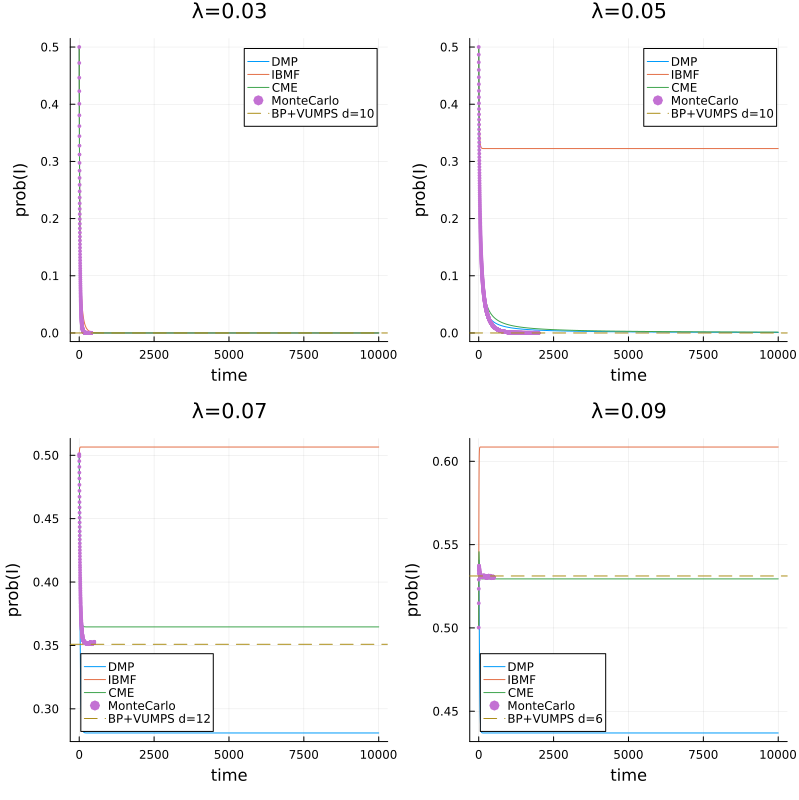

In [20]:
pl_bp = deepcopy(pl_mc)
for (pl, p, d) in zip(pl_bp, p_bp, ds)
    hline!(pl, 0:T, p[end][2:2], label="BP+VUMPS d=$d", ls=:dash)
end
plot(pl_bp..., size=(800,800))

In [21]:
@telegram "sis rrg meanfield"

In [22]:
p_mc_ss = [mean(p[end-50:end]) for p in mean.(p_mc)]
p_dmp_ss = [p[end] for p in mean.(p_dmp_disc)]
p_cme_ss = [p[end] for p in mean.(p_cme_disc)]
p_ibmf_ss = [p[end] for p in mean.(p_ibmf_disc)]
p_bp_ss = [p[end][2] for p in p_bp];

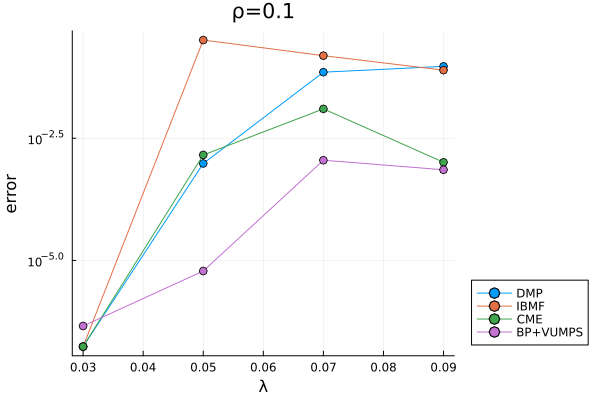

In [25]:
pl = plot(; xlabel="λ", ylabel="error", title="ρ=$ρ", yaxis=:log10, legend=:outerbottomright)
# plot!(pl, λs, p_mc_ss, label="MonteCarlo", m=:o)
plot!(pl, λs, abs.(p_dmp_ss - p_mc_ss), label="DMP", m=:o)
plot!(pl, λs, abs.(p_ibmf_ss - p_mc_ss), label="IBMF", m=:o)
plot!(pl, λs, abs.(p_cme_ss - p_mc_ss), label="CME", m=:o)
plot!(pl, λs, abs.(p_bp_ss - p_mc_ss), label="BP+VUMPS", m=:o)

In [27]:
using JLD2
jldsave("../data/sis_rrg_meanfield.jld2"; T, λs, ρ, γ, N,  p_dmp_disc, p_ibmf_disc, p_cme_disc, Ts,
    p_mc, ds, p_bp)